# Heat Transport

We will assume the heat budget in the model takes the form

\begin{align}
\frac{D \Theta}{D t} = - \nabla \cdot (\mathbf{F}^\Theta_{diff}) - \frac{1}{\rho_0 c_p }\frac{\partial Q}{\partial z}
\end{align}

The term on the LHS represents the advective flux of conservative temperature.
The first term on the RHS is the convergence of diffusive fluxes of heat.
In the model, this represents turbulent diffusion due to mesoscale eddies and small-scale mixing.
The final term is the convergence of heat fluxes from the atmosphere.

We will further assume a rigid lid.
Note that the ECCO model actually uses a sophisticated [nonlinear free surface](https://mitgcm.readthedocs.io/en/latest/algorithm/nonlinear-freesurf.html#tracer-conservation-with-non-linear-free-surface) form of the conservation equations, so these approximations aren't quite right.
But our goal here is to focus on the big picture, and these details would be a distraction.



In [1]:
import xgcm
import xarray as xr
from matplotlib import pyplot as plt
import numpy as np
import hvplot.xarray

from ecco_utils import load_ecco_v4

plt.rcParams['figure.figsize'] = (12, 6)

In [2]:
ds = load_ecco_v4()
ds

<xarray.Dataset>
Dimensions:    (face: 13, lon_c: 360, lon_g: 360, lat_c: 240, lat_g: 240, Z: 50, Zl: 50, Zp1: 51, Zu: 50, time: 288, time_snp: 287)
Coordinates: (12/42)
  * face       (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    i          (lon_c) int64 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
    i_g        (lon_g) int64 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
    j          (lat_c) int64 30 31 32 33 34 35 36 ... 264 265 266 267 268 269
    j_g        (lat_g) int64 30 31 32 33 34 35 36 ... 264 265 266 267 268 269
    k          (Z) int64 0 1 2 3 4 5 6 7 8 9 ... 40 41 42 43 44 45 46 47 48 49
    ...         ...
    dyG        (lat_c, lon_g) float32 dask.array<chunksize=(60, 90), meta=np.ndarray>
    dxG        (lat_g, lon_c) float32 dask.array<chunksize=(60, 90), meta=np.ndarray>
  * lon_c      (lon_c) float32 -37.5 -36.5 -35.5 -34.5 ... 319.5 320.5 321.5
  * lon_g      (lon_g) float32 -38.0 -37.0 -36.0 -35.0 ... 319.0 320.0 321.0
  * lat_c      (lat_c) float32 -81.46 -81.13 -80.8 -80.45 ... 67.16 67.34 67.47
  * lat_g      (lat_g) float32 -81.61 -81.28 -80.95 -80.61 ... 67.06 67.25 67.4
Data variables: (12/35)
    ADVr_SLT   (time, Zl, lat_c, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    ADVr_TH    (time, Zl, lat_c, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    DFrE_SLT   (time, Zl, lat_c, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    DFrE_TH    (time, Zl, lat_c, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    DFrI_SLT   (time, Zl, lat_c, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    DFrI_TH    (time, Zl, lat_c, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    ...         ...
    UVELMASS   (time, Z, lat_c, lon_g) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    VVELMASS   (time, Z, lat_g, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    UVELSTAR   (time, Z, lat_c, lon_g) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    VVELSTAR   (time, Z, lat_g, lon_c) float32 dask.array<chunksize=(1, 50, 60, 90), meta=np.ndarray>
    oceTAUX    (time, lat_c, lon_g) float32 dask.array<chunksize=(1, 60, 90), meta=np.ndarray>
    oceTAUY    (time, lat_g, lon_c) float32 dask.array<chunksize=(1, 60, 90), meta=np.ndarray>

## Vertically Integrated Heat Budget

Integrating the budget vertically and assuming $\eta = 0$, we obtain

\begin{align}
 \frac{\partial}{\partial t} \int_{-H}^0 \Theta dz = -
 \frac{\partial}{\partial x} \int_{-H}^0 u \Theta dz - \frac{\partial}{\partial y} \int_{-H}^0 v \Theta dz -
 \frac{\partial}{\partial x} \int_{-H}^0 F^\Theta_{diff,x} dz - \frac{\partial}{\partial y} \int_{-H}^0 F^\Theta_{diff,y} dz + \frac{Q}{\rho_0 c_p}
\end{align}

We can write this in a more compact form as
\begin{align}
 \frac{\partial}{\partial t} \int_{-H}^0 \Theta dz = -
 \nabla_H \cdot (\mathbf{F}^\Theta_{adv,H} + \mathbf{F}^\Theta_{diff,H})
 + \frac{Q}{\rho_0 c_p}
\end{align}

Where $\mathbf{F}^\Theta_{adv,H}$ and $\mathbf{F}^\Theta_{diff,H}$ are the vertically integrated advective and diffusive (2D) heat flux vectors.
The operator $\nabla_H$ represents the divergence in two dimensions (x, y).



In [3]:
from dask_gateway import Gateway
gway = Gateway()
cluster = gway.new_cluster()
cluster

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask_gateway/client.py:21: FutureWarning: format_bytes is deprecated and will be removed in a future release. Please use dask.utils.format_bytes instead.
  from distributed.utils import LoopRunner, format_bytes


In [4]:
grid = xgcm.Grid(ds, periodic=['X'])

In [5]:
fluxes = xr.Dataset({
    'F_adv_x': ds.ADVx_TH.sum('Z'),
    'F_adv_y': ds.ADVy_TH.sum('Z'),
    'F_diff_x': ds.DFxE_TH.sum('Z'),
    'F_diff_y': ds.DFyE_TH.sum('Z'),    
}).reset_coords(drop=True)
fluxes

,Array,Chunk
Bytes,94.92 MiB,31.64 kiB
Shape,"(288, 240, 360)","(1, 90, 90)"
Count,35138 Tasks,3456 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,94.92 MiB,31.29 kiB
Shape,"(288, 240, 360)","(1, 89, 90)"
Count,70562 Tasks,5760 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


In [6]:
try:
    fluxes = xr.open_dataset('tmp_data/ECCO_lateral_heat_fluxes.nc')
except FileNotFoundError:
    import dask
    cluster.scale(20)
    with cluster.get_client():
        for vname in fluxes.data_vars:
            fluxes[vname].load()
    cluster.scale(0)
    fluxes.to_netcdf('tmp_data/ECCO_lateral_heat_fluxes.nc')
fluxes

<xarray.Dataset>
Dimensions:   (time: 288, lon_g: 360, lat_c: 240, lon_c: 360, lat_g: 240)
Coordinates:
  * time      (time) datetime64[ns] 1992-01-15 1992-02-13 ... 2015-12-14
  * lon_g     (lon_g) float32 -38.0 -37.0 -36.0 -35.0 ... 319.0 320.0 321.0
  * lat_c     (lat_c) float32 -81.46 -81.13 -80.8 -80.45 ... 67.16 67.34 67.47
  * lon_c     (lon_c) float32 -37.5 -36.5 -35.5 -34.5 ... 319.5 320.5 321.5
  * lat_g     (lat_g) float32 -81.61 -81.28 -80.95 -80.61 ... 67.06 67.25 67.4
Data variables:
    F_adv_x   (time, lat_c, lon_g) float32 ...
    F_adv_y   (time, lat_g, lon_c) float32 ...
    F_diff_x  (time, lat_c, lon_g) float32 ...
    F_diff_y  (time, lat_g, lon_c) float32 ...

In [7]:
over_rA = (ds.rA.compute()**-1).fillna(0.)

advective_flux_convergence = -(
    grid.diff(fluxes.F_adv_x, 'X', boundary='extend') +
    grid.diff(fluxes.F_adv_y, 'Y', boundary='extend')
) * over_rA

diffusive_flux_convergence = -(
    grid.diff(fluxes.F_diff_x, 'X', boundary='extend') +
    grid.diff(fluxes.F_diff_y, 'Y', boundary='extend')
) * over_rA

In [8]:
rho0 = 1029.
cp = 3850.

land_mask = (ds.hFacC[0] > 0).compute()
surface_flux = ds.TFLUX.compute().where(land_mask) / (rho0 * cp)

In [9]:
clim = (-1e-4, 1e-4)
big_plot = (
 advective_flux_convergence.hvplot.quadmesh('lon_c', 'lat_c', clim=clim, cmap='RdBu_r', label='Advective_Flux_Convergence') +
 diffusive_flux_convergence.hvplot.quadmesh('lon_c', 'lat_c', clim=clim, cmap='RdBu_r', label='Meridional_Flux_Convergence') +
 surface_flux.hvplot.quadmesh('lon_c', 'lat_c',clim=clim, cmap='RdBu_r', label='Surface_Flux') 
).cols(1)
big_plot

:Layout
   .DynamicMap.I   :DynamicMap   [time]
      :QuadMesh   [lon_c,lat_c]   (Advective_Flux_Convergence)
   .DynamicMap.II  :DynamicMap   [time]
      :QuadMesh   [lon_c,lat_c]   (Meridional_Flux_Convergence)
   .DynamicMap.III :DynamicMap   [time]
      :QuadMesh   [lon_c,lat_c]   (TFLUX)

In the long term mean, we see that the convergence of the lateral fluxes balances the net air-sea fluxes quite closely.

In [10]:
import cartopy.crs as ccrs
proj = ccrs.Robinson(central_longitude=160)

fig, axes = plt.subplots(ncols=2, figsize=(16, 5), subplot_kw=dict(projection=proj, facecolor='0.9'))

for ax in axes:                                                       
    ax.coastlines()

clim = (-2e-5, 2e-5)

pc1 = surface_flux.mean('time').plot(ax=axes[0], transform=ccrs.PlateCarree(), add_colorbar=False)
pc2 = (advective_flux_convergence + diffusive_flux_convergence).mean('time').plot(ax=axes[1], transform=ccrs.PlateCarree(), add_colorbar=False)
pc1.set_clim(clim)
pc2.set_clim(clim)
axes[0].set_title('Time Mean Surface Flux')
axes[1].set_title('Time Mean Heat Transport Convergence')
plt.close()

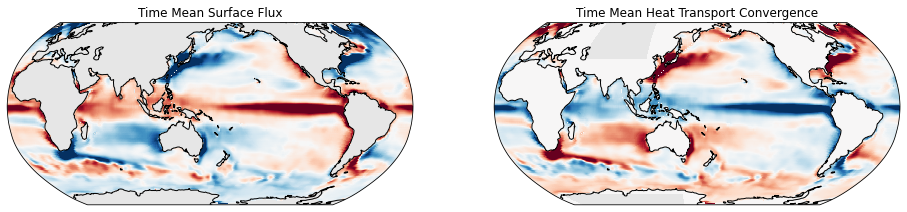

In [11]:
fig

## Ocean Meridional Heat Transport

If we integrate one more time in the $x$ (i.e. Longitude) direction, around closed latitude circules we obtain a heat budget that is a function of latitude and time only.

\begin{align}
 \frac{\partial}{\partial t} \oint dx \int_{-H}^0 \Theta dz = -
 \frac{\partial}{\partial y} \oint \int_{-H}^0 ( v \Theta + \mathbf{F}^\Theta_{diff, y}) dz dx
 + \oint \frac{Q}{\rho_0 c_p} dx
\end{align}

The first term RHS is the **Ocean Meridional Heat Transport**, a fundamental quantity in the climate system.


In [12]:
F_merid_adv = (rho0 * cp * fluxes.F_adv_y.sum('lon_c') / 1e15)
F_merid_diff = (rho0 * cp * fluxes.F_diff_y.sum('lon_c') / 1e15)
F_merid_tot = (F_merid_adv + F_merid_diff)

Text(0, 0.5, 'PW')

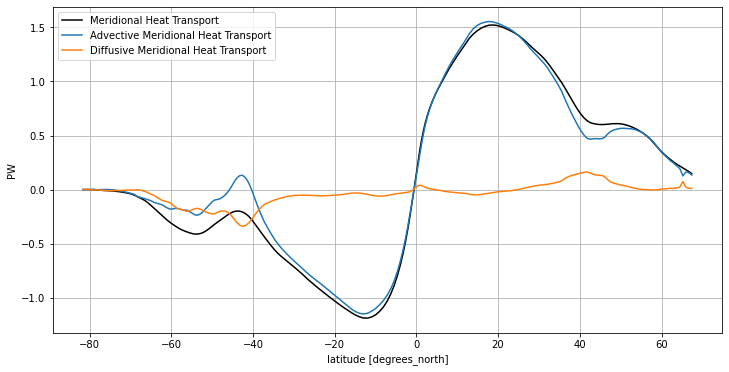

In [13]:
F_merid_tot.mean('time', keep_attrs=True).plot(color='black', label='Meridional Heat Transport')
F_merid_adv.mean('time', keep_attrs=True).plot(label='Advective Meridional Heat Transport')
F_merid_diff.mean('time', keep_attrs=True).plot(label='Diffusive Meridional Heat Transport')
plt.legend()
plt.grid()
plt.ylabel('PW')

### Separating Atlatic and Indo-Pacific

By integrating over basins separately, we reveal the very distinct patterns of meridional heat transport in the Atlantic vs. Indo-Pacific.

In [14]:
atl_basins = [2, 7, 9, 10, 12, 19]
atl_mask = sum([ds.basins == basin_num for basin_num in atl_basins])

mask_c = atl_mask.compute()
mask_v = (grid.interp(mask_c, 'Y', boundary='fill') > 0)

In [15]:
F_merid_atl = rho0 * cp * (fluxes.F_diff_y + fluxes.F_adv_y).where(mask_v).sum('lon_c').sel(lat_g=slice(-30, None)) / 1e15
F_merid_rest = rho0 * cp * (fluxes.F_diff_y + fluxes.F_adv_y).where(~mask_v).sum('lon_c').sel(lat_g=slice(-30, None)) / 1e15

Text(0, 0.5, 'PW')

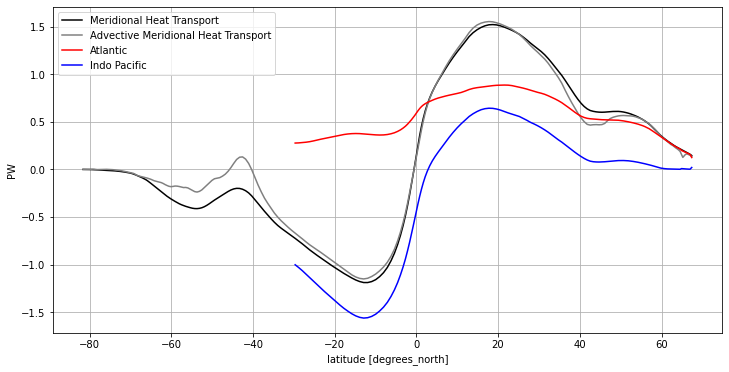

In [16]:
F_merid_tot.mean('time').plot(color='black', label='Meridional Heat Transport')
F_merid_adv.mean('time').plot(label='Advective Meridional Heat Transport', color='grey')
F_merid_atl.mean('time').plot(label='Atlantic', color='red')
F_merid_rest.mean('time').plot(label='Indo Pacific', color='blue')
plt.legend()
plt.grid()
plt.ylabel('PW')

In this view, its very clear that:
- The Atlantic transports heat northwards at all latitudes, even in the Southern Hemisphere!
- The Pacific must compensate for this in order to achieve a net southward heat transport in the Southen Hemisphere.

## Decomposing the Advective Meridional Heat Transport

What physical circulation processes are responsible for meridional heat transport?
We will partially answer this question by decomposing our heat transport into a component that can be attributed directly to the meridional overturning and a residual, representing all other elements of the flow.

The net advective meridional heat transport can be written as:

\begin{align}
 \mathcal{F}_{adv} &= \oint \int_{-H}^0 v \Theta  dz dx \\
\end{align}

Now let's define the _zonal mean_ velocity and temperature as 

$$ \overline{v} = \frac{1}{L} \oint v dx \ , \ \  \overline{\Theta} = \frac{1}{L} \oint \Theta dx$$

where $L$ is the length of the latitude circle.

The total velocity and temperature can be written as a sum of this mean component and a fluctuation from it.

$$ v = \overline{v} + v' \ , \ \ \Theta = \overline{\Theta} + \Theta' $$

Using this definition, we can write the advective transport in terms of two separate contributions.

\begin{align}
 \mathcal{F}_{adv} &= L_x \int_{-H}^0 \overline{v} \overline{\Theta}  dz dx  + \oint \int_{-H}^0 \overline{v' \Theta'}  dz dx \\
\end{align}

The quantity $L \oint \overline{v} dx = \oint v dx $ can be defined in terms of the overturning streamfunction $\Psi$ (see {doc}`overturning_circulation`).
This allows us to write

\begin{align}
 \mathcal{F}_{adv} &= - \int_{-H}^0 \frac{\partial \Psi}{\partial z} \overline{\Theta}  dz dx  + \oint \int_{-H}^0 \overline{v' \Theta'}  dz dx \\
\end{align}

Using integration by parts, together with the fact that $\Psi = 0$ at $z=0, -H$ allows us to rewrite the first term as.
\begin{align}
 \mathcal{F}_{adv} &= \int_{-H}^0 \frac{\partial \overline{\Theta}}{\partial z} \Psi  dz dx  + \oint \int_{-H}^0 \overline{v' \Theta'}  dz dx \\
\end{align}

The first term represents the overturning circulation acting on the vertical temperature gradient.
It is similar in many ways to the two-layer model of heat transport we saw in {doc}`04_advection_diffusion_continuity`.
The heat transport by the overturning circulation is proportional two two main factors:
- The strength of the overturning $\Psi$
- The mean ocean thermal stratification $\partial \overline{\Theta} / \partial z$


In [17]:
ds_theta_bar = xr.Dataset({
    'Theta_bar': ds.THETA.where(ds.hFacC>0).mean('lon_c'),
    'Theta_bar_atl': ds.THETA.where(mask_c).where(ds.hFacC>0).mean('lon_c'),
    'Theta_bar_rest': ds.THETA.where(~mask_c).where(ds.hFacC>0).mean('lon_c')
}).reset_coords(drop=True)

In [18]:
try:
    ds_theta_bar = xr.open_dataset("tmp_data/ECCO_Theta_bar.nc")
except FileNotFoundError:
    cluster.scale(20)
    with cluster.get_client():
        ds_theta_bar.load()
    cluster.scale(0)
    ds_theta_bar.to_netcdf("tmp_data/ECCO_Theta_bar.nc")

In [19]:
ds_transport = xr.open_dataset('tmp_data/ECCO_overturning_transport.nc')
ds_transport

<xarray.Dataset>
Dimensions:      (time: 288, Z: 50, lat_g: 240)
Coordinates:
  * time         (time) datetime64[ns] 1992-01-15 1992-02-13 ... 2015-12-14
  * Z            (Z) float32 -5.0 -15.0 -25.0 ... -5.461e+03 -5.906e+03
  * lat_g        (lat_g) float32 -81.61 -81.28 -80.95 ... 67.06 67.25 67.4
Data variables:
    V_atl        (time, Z, lat_g) float32 ...
    V_rest       (time, Z, lat_g) float32 ...
    V_eddy_atl   (time, Z, lat_g) float32 ...
    V_eddy_rest  (time, Z, lat_g) float32 ...

In [20]:
Theta_bar_g = grid.interp(ds_theta_bar.Theta_bar, 'Y', boundary='extend')
Theta_bar_atl_g = grid.interp(ds_theta_bar.Theta_bar_atl, 'Y', boundary='extend')
Theta_bar_rest_g = grid.interp(ds_theta_bar.Theta_bar_rest, 'Y', boundary='extend')

F_adv_MOC = rho0 * cp * (Theta_bar_g * (ds_transport.V_atl + ds_transport.V_rest)).sum('Z') / 1e15
F_adv_MOC_atl = rho0 * cp * (Theta_bar_atl_g * ds_transport.V_atl).sum('Z').sel(lat_g=slice(-30, None)) / 1e15
F_adv_MOC_rest = rho0 * cp * (Theta_bar_rest_g * ds_transport.V_rest).sum('Z').sel(lat_g=slice(-30, None)) / 1e15

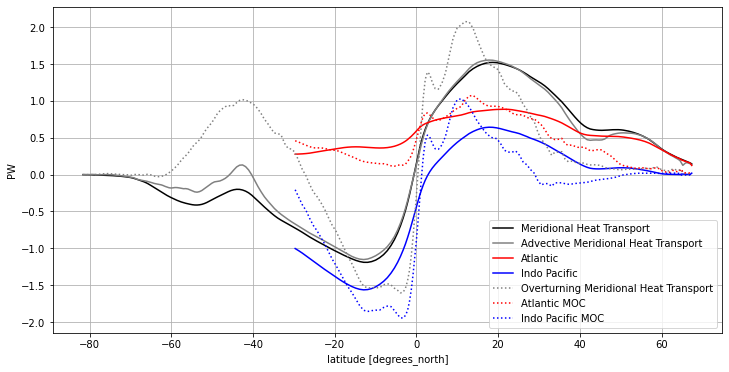

In [21]:
F_merid_tot.mean('time').plot(color='black', label='Meridional Heat Transport')
F_merid_adv.mean('time').plot(label='Advective Meridional Heat Transport', color='grey')
F_merid_atl.mean('time').plot(label='Atlantic', color='r')
F_merid_rest.mean('time').plot(label='Indo Pacific', color='b')
F_adv_MOC.mean('time').plot(label='Overturning Meridional Heat Transport', color='grey', linestyle=':')
F_adv_MOC_atl.mean('time').plot(label='Atlantic MOC', color='r', linestyle=':')
F_adv_MOC_rest.mean('time').plot(label='Indo Pacific MOC', color='b', linestyle=':')
plt.legend()
plt.grid()
plt.ylabel('PW');

In the above figure, we can see clearly how the overturning contributes to MHT. In general the overturning MHT curve has more extrema than the full MHT curve, suggesting that the non-overturning processes often oppose the overturnin in terms of heat transport.

In the Northern Hemisphere, the overturning MHT is very strong in the subtropics--likely associated with the shallow tropical overturning--and tends to zero by 45 N.
The decomposition by basin shows in the Atlantic, overturning MHT and total Atlantic MHT are quite closely aligned at lower latitudes.
The fact that the AMOC is positive in both hemispheres is clearly responsible for the overall northward MHT in the Atlantic; this can be seen from the form of the equation for overturning meridional heat transport:

$$\frac{\partial \overline{\Theta}}{\partial z} \Psi$$

Since both $Psi$ and  $\partial \overline{\Theta} / \partial z$ are positive, the AMOC heat transport is positive.

The Southern Ocean is pretty interesting too.
The overturning MHT is northwards, while the total advective MHT relatively close to zero.
This suggests that some other advective process must be working in opposition to the overturning MHT.
As we will see when we look deeper at the Southern Ocean, this other process is transport by the transient eddies and stationary meanders of the ACC.